# How did countries respond to the COVID-19 outbreak?

## Motivation

### Dataset
The main datasets used in this project are a Covid-19 death count dataset and a country response dataset. 

The country response dataset contains the primary interest of what will be explored. Previously a different countermeasure dataset was used, but the authors of it stopped updating it, and so the current dataset was chosen instead.

It was disscussed whether to use data for death count of confirmed cases. It can be assumed that confirmed cases could give a better visualisation of the total number of cases however, this data is more prone to errors as it can be assumed that theres a lot of error in how the data is collected as well as having a lot of un-reported cases. The death count data is less prone to error in terms of un-reported cases, which is why it was chosen for this visualisation. 

#### The Covid-19 Death Count Dataset
The Covid-19 death count dataset contains the death count for 266 provinces/states in 212 different countries with one entry per date from the 22'nd of January and is updated daily with the newest data (at the time of writing this). 

The data can be found here: (https://data.humdata.org/dataset/novel-coronavirus-2019-ncov-cases)


#### The Government Response Dataset 

The government responce dataset sontains collumns for different policies that score how much a government have acted in terms of different countermeasures. For example, not every country has enforced stay at home policies to the same degree. The stringencyindex collumn contains weigthed totals across all counter measures for all the countries in the set. 

The rows in this dataset represents a countr x for a given day y. Becourse of this, theres multiple repeats of the countries across all the recorded days. The days start at the 1st of january.

The dataset is updated daily, thou not every country has data for every given day so theres still some empty data in the set. But as a whole it is very complete.

This (https://www.bsg.ox.ac.uk/sites/default/files/2020-05/BSG-WP-2020-032-v5.0_0.pdf) report explains the data in greater detail, but as of this writing it is out of date, and some columns has since been renamed and changed.

For this analysis the countermesures to prevent spread of the virus is more important, but the dataset also has indicators for economic and health aid.

The data can be found here: (https://github.com/OxCGRT/covid-policy-tracker/tree/master/data)

#### Other Datasets Used
A few additional datasets are also used to enrich the visualizations and data analysis. 

- Geo data is needed to draw the different countries onto a map. It is found here  https://www.naturalearthdata.com/downloads/110m-cultural-vectors/
- Confirmed cases data contains data of the confirmed cases for each country instead of the death count. This dataset is also found here (https://data.humdata.org/dataset/novel-coronavirus-2019-ncov-cases) in case it gets usefull later on.
- Population data is not pressent in the two big datasets, however it is usefull to know this going into the analysis. The population data is found here: (https://data.worldbank.org/indicator/sp.pop.totl)

All datasets are also available in our [GitHub repository](https://github.com/MFHolm/socialData/tree/master/data)

### Goal
The goal is to explore and visualize a potential correlation between countermeasures to prevent spread of covid-19 and deaths due to the pandemic. This includes the effect of different countermeasures, how early they have to be implimented for them to work, and give an overwiev over how different countries responces have affected the spread differently.

## Basic stats
### Preprocessing

The following describes how the data is prepared for exploration and analysis.

#### Confirmed Cases

Dataset containing total confirmed cases for a number of countries with one entry per date starting on the 22'nd of January. 

First the data is read and stored in a dataframe. Only the relevant columns are selected. 

In [1]:
import pandas as pd 
#Confirmed cases datafile
datafile = './data/time_series_covid19_confirmed_global_iso3_regions.csv'
#Read using pandas. Only include relevant columns
confirmed_df = pd.read_csv(datafile,usecols = lambda column : column not in ['Lat', 'Long','Region Code', 'Region Name', 'Sub-region Code', 'Sub-region Name', 'Intermediate Region Code','Intermediate Region Name'])
#Rename column for consistency
confirmed_df = confirmed_df.rename(columns={"ISO 3166-1 Alpha 3-Codes": "country_code"})
confirmed_df.drop(0, inplace = True)
confirmed_df.head()

,Province/State,Country/Region,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,...,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,country_code
1,NaN,Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2894.0,3224.0,3392.0,3563.0,3778.0,4033.0,4402.0,4687.0,4963.0,AFG
2,NaN,Albania,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,803.0,820.0,832.0,842.0,850.0,856.0,868.0,872.0,876.0,ALB
3,NaN,Algeria,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4648.0,4838.0,4997.0,5182.0,5369.0,5558.0,5723.0,5891.0,6067.0,DZA
4,NaN,Andorra,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,750.0,751.0,751.0,752.0,752.0,754.0,755.0,755.0,758.0,AND
5,NaN,Angola,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,35.0,36.0,36.0,36.0,43.0,43.0,45.0,45.0,45.0,AGO


The count per country is is calculated and saved. For some countries the count has been entered for individual provinces or states, but for this project only the total count for each country is needed, therefore the data is grouped by country and summed to get the count for each country.

In [2]:
confirmed_df = confirmed_df.groupby(['country_code']).sum().reset_index()

In [3]:
confirmed_df.head()

,country_code,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,...,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20
0,ABW,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,100.0,100.0,101.0,101.0,101.0,101.0,101.0,101.0,101.0,101.0
1,AFG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2704.0,2894.0,3224.0,3392.0,3563.0,3778.0,4033.0,4402.0,4687.0,4963.0
2,AGO,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,35.0,35.0,36.0,36.0,36.0,43.0,43.0,45.0,45.0,45.0
3,AIA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0
4,ALB,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,795.0,803.0,820.0,832.0,842.0,850.0,856.0,868.0,872.0,876.0


#### Geo Data
The geo file is needed for drawing the map.
It is read using geopandas and modified for better usability.

In [4]:
import geopandas as gpd

#Shape file
shapefile = './data/geo_data/ne_110m_admin_0_countries.shp'
#Read shapefile using Geopandas. Only take the columns needed
gdf = gpd.read_file(shapefile)[['ADMIN', 'ADM0_A3', 'geometry']]
#Rename columns
gdf.columns = ['country', 'country_code', 'geometry']
#Remove antartica because it is irrelevant and takes up a lot of space
gdf = gdf.drop(gdf.index[159]) 
gdf.head()

,country,country_code,geometry
0,Fiji,FJI,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,United Republic of Tanzania,TZA,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,Western Sahara,SAH,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,Canada,CAN,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,United States of America,USA,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."


#### Death count

The death count file is read using pandas and also modified for better usability.

In [5]:
#Death count datafile
datafile = './data/time_series_covid19_deaths_global_iso3_regions.csv'
#Read using pandas. Only include relevant columns
deaths_df = pd.read_csv(datafile,usecols = lambda column : column not in ['Region Code', 'Region Name', 'Sub-region Code', 'Sub-region Name', 'Intermediate Region Code','Intermediate Region Name'])
#Rename column for consistency
deaths_df = deaths_df.rename(columns={"ISO 3166-1 Alpha 3-Codes": "country_code"})
deaths_df = deaths_df.rename(columns={"Country/Region": "country"})
deaths_df.drop(0, inplace = True)
deaths_df.head()

,Province/State,country,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,country_code
1,NaN,Afghanistan,33.0,65.0,0.0,0.0,0.0,0.0,0.0,0.0,...,104.0,106.0,109.0,115.0,120.0,122.0,127.0,132.0,136.0,AFG
2,NaN,Albania,41.1533,20.1683,0.0,0.0,0.0,0.0,0.0,0.0,...,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0,ALB
3,NaN,Algeria,28.0339,1.6596,0.0,0.0,0.0,0.0,0.0,0.0,...,476.0,483.0,488.0,494.0,502.0,507.0,515.0,522.0,529.0,DZA
4,NaN,Andorra,42.5063,1.5218,0.0,0.0,0.0,0.0,0.0,0.0,...,46.0,47.0,47.0,48.0,48.0,48.0,48.0,49.0,49.0,AND
5,NaN,Angola,-11.2027,17.8739,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,AGO


First the total number of dead is saved in a separate dataframe.

In [6]:
#Sum date columns and save to a new dataframe
global_dead_df = deaths_df.sum(numeric_only=True).reset_index()

In [7]:
#Rename columns
global_dead_df.columns=['date', 'dead']

In [8]:
global_dead_df.head()

,date,dead
0,1/22/20,17.0
1,1/23/20,18.0
2,1/24/20,26.0
3,1/25/20,42.0
4,1/26/20,56.0


Then the death count per country is is calculated and saved. For some countries the death count has been entered for individual provinces or states, therefore the data is grouped by country and summed to get the count for each country.

In [9]:
deaths_df.head()

,Province/State,country,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,country_code
1,NaN,Afghanistan,33.0,65.0,0.0,0.0,0.0,0.0,0.0,0.0,...,104.0,106.0,109.0,115.0,120.0,122.0,127.0,132.0,136.0,AFG
2,NaN,Albania,41.1533,20.1683,0.0,0.0,0.0,0.0,0.0,0.0,...,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0,ALB
3,NaN,Algeria,28.0339,1.6596,0.0,0.0,0.0,0.0,0.0,0.0,...,476.0,483.0,488.0,494.0,502.0,507.0,515.0,522.0,529.0,DZA
4,NaN,Andorra,42.5063,1.5218,0.0,0.0,0.0,0.0,0.0,0.0,...,46.0,47.0,47.0,48.0,48.0,48.0,48.0,49.0,49.0,AND
5,NaN,Angola,-11.2027,17.8739,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,AGO


In [10]:
country_total_df = deaths_df.groupby(['country_code','country']).sum().reset_index()

In [11]:
country_total_df.head()

,country_code,country,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,...,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20
0,ABW,Netherlands,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,2.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0
1,AFG,Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,95.0,104.0,106.0,109.0,115.0,120.0,122.0,127.0,132.0,136.0
2,AGO,Angola,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
3,AIA,United Kingdom,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,ALB,Albania,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0


#### Government Responses Dataset
The 'timeseries' form is used. The dataset consists of multiple sheets, one for each countermeasure.

First the data is read and saved in a dictionary. Only the relevant sheets are stored.

In [12]:
xls = pd.ExcelFile('./data/OxCGRT_timeseries_all.xlsx')
xls.sheet_names

['stringencyindex_legacy',
 'c1_schoolclosing',
 'c1_flag',
 'c2_workplaceclosing',
 'c2_flag',
 'c3_cancelpublicevents',
 'c3_flag',
 'c4_restrictionsongatherings',
 'c4_flag',
 'c5_closepublictransport',
 'c5_flag',
 'c6_stayathomerequirements',
 'c6_flag',
 'c7_domestictravel',
 'c7_flag',
 'c8_internationaltravel',
 'h1_publicinfocampaign',
 'h1_flag',
 'h2_testingpolicy',
 'h3_contacttracing',
 'confirmedcases',
 'confirmeddeaths']

In [13]:
relevant_sheets = [sheet for sheet in xls.sheet_names if '_' in sheet and not 'flag' in sheet]
relevant_sheets

['stringencyindex_legacy',
 'c1_schoolclosing',
 'c2_workplaceclosing',
 'c3_cancelpublicevents',
 'c4_restrictionsongatherings',
 'c5_closepublictransport',
 'c6_stayathomerequirements',
 'c7_domestictravel',
 'c8_internationaltravel',
 'h1_publicinfocampaign',
 'h2_testingpolicy',
 'h3_contacttracing']

In [14]:
countermeasure_dfs = pd.read_excel('./data/OxCGRT_timeseries_all.xlsx', sheet_name=relevant_sheets)

A helper method is defined to convert dates to the same format as in the other datasets. 

In [15]:
def convertDate(date): 
    #do nothing if it is one of the two special columns
    if (date =='CountryName' or date =='CountryCode'): return date
    # convert e.g. 22jan2020 into 1/22/20
    s = str(date)
    day = str(int(s[0:2]))
    month = s[2:5]
   
    switcher = {
        'jan': 1,
        'feb': 2,
        'mar': 3,
        'apr': 4,
        'may': 5
    }
    month = str(switcher[month])
    year = s[7:9]
    
    return month + '/' + day + '/' + year


The dataframes are formatted for better usability. The date is converted using the helper method defined above and the the country code column is renamed for consistency. 

In [16]:
#Each dataframe is formatted
for key in countermeasure_dfs.keys():
    #Convert date
    countermeasure_dfs[key].columns =  countermeasure_dfs[key].columns.to_series().apply(convertDate)
    #Rename column
    countermeasure_dfs[key] = countermeasure_dfs[key].rename(columns={"CountryCode": "country_code"})
    countermeasure_dfs[key] = countermeasure_dfs[key].rename(columns={"CountryName": "country"})
    

Take a look at one of the dataframes

In [17]:
countermeasure_dfs['c1_schoolclosing'].head()

,country,country_code,1/1/20,1/2/20,1/3/20,1/4/20,1/5/20,1/6/20,1/7/20,1/8/20,...,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20
0,Aruba,ABW,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,NaN,NaN
1,Afghanistan,AFG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.0,3.0,3.0,3.0,3.0,3.0,NaN,NaN,NaN,NaN
2,Angola,AGO,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.0,3.0,3.0,3.0,3.0,3.0,3.0,NaN,NaN,NaN
3,Albania,ALB,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.0,3.0,3.0,3.0,3.0,3.0,3.0,NaN,NaN,NaN
4,Andorra,AND,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.0,3.0,3.0,3.0,3.0,NaN,NaN,NaN,NaN,NaN


#### Countermeasures Dataset in another format

The countermeasures data file is read using pandas. Flag and notes columns are emitted as these are not relevant for this analysis.

In [18]:
countermeasures_file = './data/OxCGRT_latest.csv'
#Read csv file using pandas
countermeasures_df = pd.read_csv(countermeasures_file, usecols = lambda column : ('_Flag' not in column and '_Notes' not in column))
countermeasures_df = countermeasures_df.rename(columns={"CountryCode": "country_code"})
countermeasures_df.head()

,CountryName,country_code,Date,C1_School closing,C2_Workplace closing,C3_Cancel public events,C4_Restrictions on gatherings,C5_Close public transport,C6_Stay at home requirements,C7_Restrictions on internal movement,...,H3_Contact tracing,H4_Emergency investment in healthcare,H5_Investment in vaccines,M1_Wildcard,ConfirmedCases,ConfirmedDeaths,StringencyIndex,StringencyIndexForDisplay,LegacyStringencyIndex,LegacyStringencyIndexForDisplay
0,Aruba,ABW,20200101,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0
1,Aruba,ABW,20200102,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0
2,Aruba,ABW,20200103,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0
3,Aruba,ABW,20200104,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0
4,Aruba,ABW,20200105,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0


Columns names are modified so they do not include spaces.



In [19]:
countermeasures_df.columns = countermeasures_df.columns.str.replace(' ', '_')


The date column is formatted so it has the same format as in the death count dataframe



In [20]:
def convertDate(date): 
    # convert 20200122 into 1/22/20
    s = str(date)
    year = s[2:4]
    month = s[5:6]
    day = str(int(s[6:8]))
    return month + '/' + day + '/' + year

countermeasures_df['Date'] = countermeasures_df['Date'].apply(convertDate)

In [21]:
countermeasures_df.head()


,CountryName,country_code,Date,C1_School_closing,C2_Workplace_closing,C3_Cancel_public_events,C4_Restrictions_on_gatherings,C5_Close_public_transport,C6_Stay_at_home_requirements,C7_Restrictions_on_internal_movement,...,H3_Contact_tracing,H4_Emergency_investment_in_healthcare,H5_Investment_in_vaccines,M1_Wildcard,ConfirmedCases,ConfirmedDeaths,StringencyIndex,StringencyIndexForDisplay,LegacyStringencyIndex,LegacyStringencyIndexForDisplay
0,Aruba,ABW,1/1/20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0
1,Aruba,ABW,1/2/20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0
2,Aruba,ABW,1/3/20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0
3,Aruba,ABW,1/4/20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0
4,Aruba,ABW,1/5/20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0


#### Population
To be able to show dead per million, the population count for each country is needed. 

In [22]:
#Population datafile
datafile = './data/population.csv'
#Read using pandas. Only include relevant columns
population = pd.read_csv(datafile,header=2, usecols = lambda column : column in ['Country Code', '2018'])
#Rename columns
population.columns=['country_code', 'population']

Add population info to country death count dataframe by merging population with dataframe.

In [23]:
#Merge on contry code
country_total_df_with_population = country_total_df.merge(population, on = 'country_code', how = 'left').reset_index(drop=True)
country_total_df_with_population.head()

,country_code,country,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,...,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,population
0,ABW,Netherlands,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,105845.0
1,AFG,Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,104.0,106.0,109.0,115.0,120.0,122.0,127.0,132.0,136.0,37172386.0
2,AGO,Angola,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,30809762.0
3,AIA,United Kingdom,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
4,ALB,Albania,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0,2866376.0


The population is missing for some countries. The following lists all rows with missing population.

In [24]:
#List rows with missing population
country_total_df_with_population[country_total_df_with_population['population'].isna()]

,country_code,country,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,...,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,population
3,AIA,United Kingdom,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
16,BES,Netherlands,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
23,BLM,France,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
59,ERI,Eritrea,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
60,ESH,Western Sahara,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
66,FLK,United Kingdom,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
75,GLP,France,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,13.0,NaN
83,GUF,France,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,NaN
136,MSR,United Kingdom,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,NaN
137,MTQ,France,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,14.0,14.0,14.0,14.0,14.0,14.0,14.0,14.0,14.0,NaN


The population count is missing for 17 of the countries in the death count dataset. Since there are only 17 missing values these are added manually. The population for every country but two is found on www.worldometers.info. The sources for the other two are listed below.

AIA Anguilla: 14,731

BES Caribbean Netherlands: 25,987 (source https://en.wikipedia.org/wiki/Caribbean_Netherlands)

BLM Saint Barthélemy 9,793 (source https://en.wikipedia.org/wiki/Saint_Barth%C3%A9lemy)

ESH Western Sahara: 567,402

FLK Falkland Islands: 3,234

GLP Guadeloupe: 400,124

GUF French Guiana: 298,682

MSR Montserrat: 4,992

MTQ Martinique: 375,265

MYT Mayotte: 272,815 (source https://en.wikipedia.org/wiki/Mayotte)

REU Réunion: 859,959 (source https://en.wikipedia.org/wiki/R%C3%A9union)

SPM Saint Pierre and Miquelon: 6,008 (source https://en.wikipedia.org/wiki/Saint_Pierre_and_Miquelon)


TWN Taiwan: 23,726,460

ERI Eritrea: 3,457,786

VAT Holy See: 801

RKS Kosovo: 1,797,086 (source: https://en.wikipedia.org/wiki/Demographics_of_Kosovo)




The population is added manually by index.

In [25]:
#Set population value for the missing countries
country_total_df_with_population.at[3,'population'] = 14731
country_total_df_with_population.at[16,'population'] = 25987 
country_total_df_with_population.at[23,'population'] = 9793
country_total_df_with_population.at[59,'population'] = 3457786
country_total_df_with_population.at[60,'population'] = 567402
country_total_df_with_population.at[66,'population'] = 3234
country_total_df_with_population.at[75,'population'] = 400124
country_total_df_with_population.at[83,'population'] = 298682
country_total_df_with_population.at[136,'population'] = 4992
country_total_df_with_population.at[137,'population'] = 375265
country_total_df_with_population.at[141,'population'] = 272815
country_total_df_with_population.at[163,'population'] = 859959
country_total_df_with_population.at[164,'population'] = 1797086 
country_total_df_with_population.at[176,'population'] = 6008
country_total_df_with_population.at[197,'population'] = 23726460
country_total_df_with_population.at[204,'population'] = 801

A final check to ensure that there are no missing values.

In [26]:
country_total_df_with_population[country_total_df_with_population['population'].isna()]

,country_code,country,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,...,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,population


In [27]:
country_total_df_with_population.isnull().values.any()

False

The dataframe is now complete. 

#### Dataframe with dead per million
To make it easier to work with a separate dataframe is created where the death count is listed as number of dead per million instead of total number of dead. 

First a list of the relevant columns is created. These are all the date columns. There are a few special columns that do not contain other values for the countries than dead count. These are the columns: country, country code, geometry and the newly added population. 

In [28]:
#List special columns
special_columns = ['country', 'country_code', 'geometry', 'population']
#List date columns by taking every column that is not in the other list
date_columns = [x for x in country_total_df_with_population.columns if x not in special_columns]

The new dataframe is created by dividing by population divided with a million. There are some 'no data' values which must be skipped and there are some countries with a population of zero witch must also be skipped. 

In [29]:
#Copy the country total dataframe
dead_per_million_df = country_total_df_with_population.copy()
for date in date_columns: 
    #Convert column to numeric
    dead_per_million_df[date]= pd.to_numeric(dead_per_million_df[date], errors='coerce')
    #Calculate dead per million
    dead_per_million_df[date] = (dead_per_million_df[date]/((country_total_df_with_population['population'])/1000000)).where(not(isinstance(country_total_df_with_population[date], str) ) and (country_total_df_with_population['population']>0), dead_per_million_df[date])


Take a look at the new dataframe. 

In [30]:
dead_per_million_df[dead_per_million_df['country']=='Denmark']

,country_code,country,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,...,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,population
54,DNK,Denmark,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,87.337209,88.718035,90.09886,90.789273,91.307082,91.997495,90.961876,91.997495,92.687908,5793636.0
68,FRO,Denmark,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,48497.0
81,GRL,Denmark,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,56025.0



### Data Exploration

### Death Count Data
In the following the initial processing and exploration of the death count dataset is done.

There are two dataframes: one with global death count and one with death count per country. 

The global death count dataset contains only two columns: date and number of dead. 

In [31]:
global_dead_df.head()

,date,dead
0,1/22/20,17.0
1,1/23/20,18.0
2,1/24/20,26.0
3,1/25/20,42.0
4,1/26/20,56.0


In [32]:
global_dead_df.shape

(114, 2)

There are 114 rows i.e. 114 dates in the dataset. 

The dataframe is plotted using a line plot to get an overview of the data. 

In [33]:
import matplotlib.pyplot as plt
ax = global_dead_df.plot.line(title='Total Confirmed COVID-19 Deaths', x = 'date', y='dead', figsize=(20,10), legend=False);

#Format figure
fig = ax.get_figure()
ax.set_xlabel('Date', fontsize=20)
ax.set_ylabel('Death Count', fontsize=20)
ax.tick_params(labelsize=18)
ax.title.set_size(30)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
fig.savefig('./fig/total_dead.png')

The death count is nearly 0 until around the 20'th of March where it really takes of and grows steadily.

Looking at the other dataset containing data for each country gives us an overview of how many have died in each country.

In [34]:
country_total_df.head()

,country_code,country,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,...,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20
0,ABW,Netherlands,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,2.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0
1,AFG,Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,95.0,104.0,106.0,109.0,115.0,120.0,122.0,127.0,132.0,136.0
2,AGO,Angola,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
3,AIA,United Kingdom,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,ALB,Albania,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0


In [35]:
country_total_df.shape

(213, 116)

There is one row for each country. The first two columns indicate which country it is: one containing the ISO 3166-1 Alpha 3 code for the country and one containing the country name. The rest of the columns are date columns ranging from 1/22 to 5/12. There is a total of 212 countries and a total of 112 date columns. 

To get an overview of the data the newest death count for each country is visualized using a bar plot. 

In [36]:
#Take newest column which is the last column in the dataframe
newest = country_total_df.iloc[:,[1,-1]]
#Rename columns
newest.columns=['country','dead']


A histogram is well suited to give an overview of the distribution of the data. 

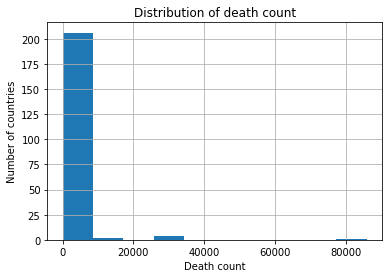

In [37]:
#Plot histogram
ax = newest.hist()
ax[0][0].set_xlabel("Death count")
ax[0][0].set_ylabel("Number of countries")
ax[0][0].set_title('Distribution of death count');

The plot shows that the majority of countries have a very low death count compared to a few others. 


Let us zoom in on the countries with most dead. These are plotted in a bar plot below.

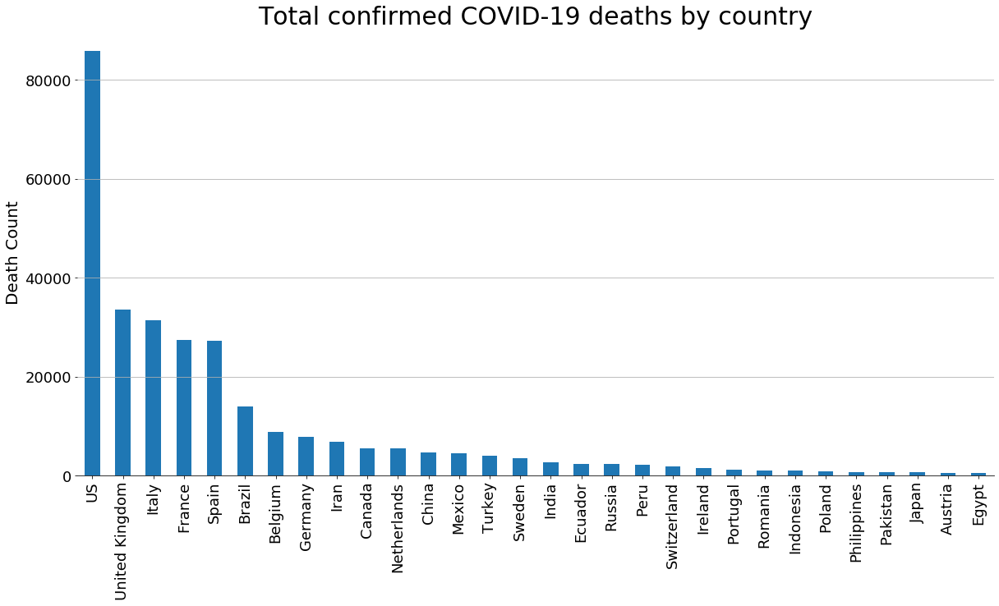

In [38]:
#Plot in using a bar plot
ax = newest.sort_values(by='dead', ascending=False)[:30].plot.bar(legend=False,title='Total confirmed COVID-19 deaths by country', x = 'country', y='dead', figsize=(20,10));

fig = ax.get_figure()
ax.set_xlabel('')
ax.set_ylabel('Death Count', fontsize=20)
ax.tick_params(labelsize=18)
ax.title.set_size(30)
ax.grid(axis='y')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
fig.savefig('./fig/death_by_country.png')

What happens if we look at dead per million instead?

In [39]:
#Select columns
newest_per_million = dead_per_million_df.iloc[:,[1,-2]]
#Rename columns
newest_per_million.columns=['country','dead']


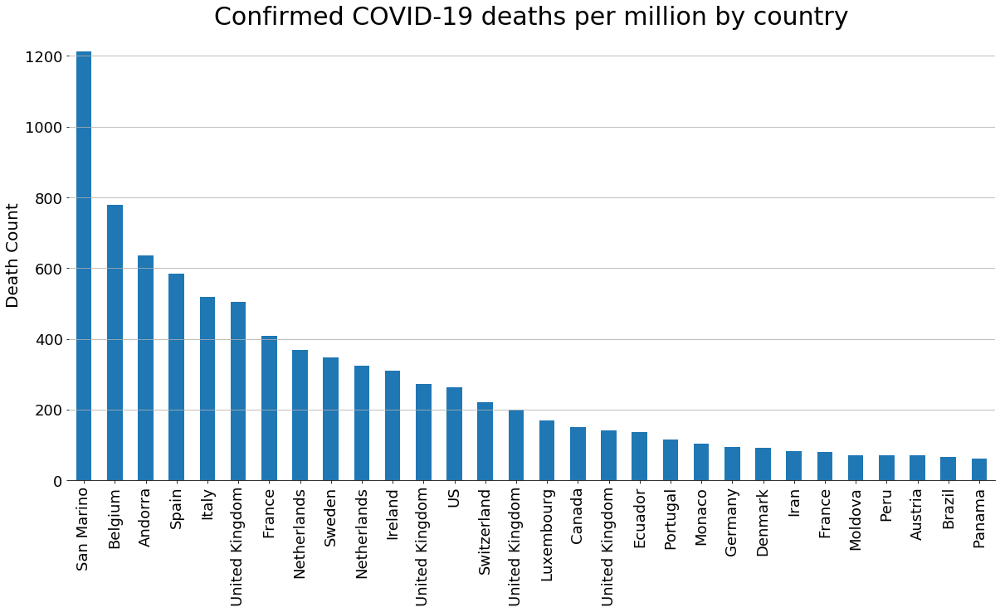

In [40]:
#Plot
ax = newest_per_million.sort_values(by='dead', ascending=False)[:30].plot.bar(legend=False,title='Confirmed COVID-19 deaths per million by country', x = 'country', y='dead', figsize=(20,10));

#Format figure
fig = ax.get_figure()
ax.set_xlabel('')
ax.set_ylabel('Death Count', fontsize=20)
ax.tick_params(labelsize=18)
ax.title.set_size(30)
ax.grid(axis='y')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
fig.savefig('./fig/dead_per_mill_by_country.png')

Death count per million shows quite a different picture than total death count. The top 5 countries are still in there but they are not in top 5 any more. When comparing countries dead per million might be more relevant than total death count. 

#### Geographical Distribution
To get a geographical overview of the death count the count is plotted on a world map. For this the deaths dataframe is used where death count is not grouped by country but there are individual counts for some provinces and states.

In [41]:
deaths_df.head()

,Province/State,country,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,country_code
1,NaN,Afghanistan,33.0,65.0,0.0,0.0,0.0,0.0,0.0,0.0,...,104.0,106.0,109.0,115.0,120.0,122.0,127.0,132.0,136.0,AFG
2,NaN,Albania,41.1533,20.1683,0.0,0.0,0.0,0.0,0.0,0.0,...,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0,ALB
3,NaN,Algeria,28.0339,1.6596,0.0,0.0,0.0,0.0,0.0,0.0,...,476.0,483.0,488.0,494.0,502.0,507.0,515.0,522.0,529.0,DZA
4,NaN,Andorra,42.5063,1.5218,0.0,0.0,0.0,0.0,0.0,0.0,...,46.0,47.0,47.0,48.0,48.0,48.0,48.0,49.0,49.0,AND
5,NaN,Angola,-11.2027,17.8739,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,AGO


In [42]:
import folium
import math

#Define helper method to get the country name nicely formatted. 
def getCountry(row):
    #If there is a province/state then include it and the country name in parenthesis
    if isinstance(row['Province/State'], str):
        return str(row['Province/State']) + '('+ row.country+')'
    #If there is not province/state then just retunr the country name
    else:
        return row.country

#Create folium map
world_map = folium.Map([20, 0],tiles = "Stamen Terrain", zoom_start=2)

#Plot death count on map with red dots with a radius corresponding the number of dead
for index,row in deaths_df.iterrows(): 
    #Only plot counts of more than zero
    if (row[deaths_df.columns[-2]] > 0):
        folium.CircleMarker([row.Lat, row.Long],
                        radius=(row[deaths_df.columns[-2]])/3000, 
                        popup= getCountry(row) + ' \n'+ str(row[country_total_df.columns[-1]]),
                        fill=True, # Set fill to True
                        fill_color='red',
                        color='red',
                        weight=0.1,
                        fill_opacity=0.6
                        ).add_to(world_map)

world_map.save(outfile= "./fig/folium_map.html")
world_map

From the map it is evident that the US and Europe are heavily affected.

#### Government Responses dataset

The response/countermeasures dataset is a dictionary of 12 different dataframes, one for each measure. 

In [43]:
countermeasure_dfs.keys()

odict_keys(['stringencyindex_legacy', 'c1_schoolclosing', 'c2_workplaceclosing', 'c3_cancelpublicevents', 'c4_restrictionsongatherings', 'c5_closepublictransport', 'c6_stayathomerequirements', 'c7_domestictravel', 'c8_internationaltravel', 'h1_publicinfocampaign', 'h2_testingpolicy', 'h3_contacttracing'])

In [44]:
for key in countermeasure_dfs.keys():
    print(key)
    print(countermeasure_dfs[key].shape)

stringencyindex_legacy
(162, 136)
c1_schoolclosing
(162, 136)
c2_workplaceclosing
(162, 136)
c3_cancelpublicevents
(162, 136)
c4_restrictionsongatherings
(162, 136)
c5_closepublictransport
(162, 136)
c6_stayathomerequirements
(162, 136)
c7_domestictravel
(162, 136)
c8_internationaltravel
(162, 136)
h1_publicinfocampaign
(162, 136)
h2_testingpolicy
(162, 136)
h3_contacttracing
(162, 136)


Each dataframe consists of 161 rows and 135 columns. There is one row for each country and there are two columns indicating what country this is: country name and SO 3166-1 Alpha 3 code for the country. The rest of the columns are date columns ranging from the 1'st of January and updated daily. 

In [45]:
countermeasure_dfs['c1_schoolclosing'].head()

,country,country_code,1/1/20,1/2/20,1/3/20,1/4/20,1/5/20,1/6/20,1/7/20,1/8/20,...,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20
0,Aruba,ABW,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,NaN,NaN
1,Afghanistan,AFG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.0,3.0,3.0,3.0,3.0,3.0,NaN,NaN,NaN,NaN
2,Angola,AGO,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.0,3.0,3.0,3.0,3.0,3.0,3.0,NaN,NaN,NaN
3,Albania,ALB,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.0,3.0,3.0,3.0,3.0,3.0,3.0,NaN,NaN,NaN
4,Andorra,AND,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.0,3.0,3.0,3.0,3.0,NaN,NaN,NaN,NaN,NaN


To get an overview over when countries reacted to the outbreak the stringency index dataframe is explored further. 

It is interesting to see when the first countermeasures were initiated. The date of the first countermeasures can be obtained by looking at the date when the stringency index became larger than zero. 

First rows with no data are removed. 

In [46]:
#Store the two country columns
country_cols = countermeasure_dfs['stringencyindex_legacy'].columns[0:2]
#Store all date columns
date_cols = countermeasure_dfs['stringencyindex_legacy'].columns[3:]
#Copy the dataframe to a new variable
stringency_df = countermeasure_dfs['stringencyindex_legacy'].copy()


In [47]:
#Drop rows with NaN values
stringency_df =stringency_df.dropna(subset=date_cols, how = 'all').reset_index(drop=True)

Additional to obtaining the date for the first countermeasure, the date when the stringency index reached 10, 20, 30, .., 90 are also saved. These dates are saved in new columns in the same dataframe.

In [48]:
import numpy as np

#Helper method to get first item in list of dates
def getFirst(l):
    #If any dates were found then return the first
    if (len(l) > 0):
        return l[0]
    else:
        #If no dates were found, then return the last day possible 
        return len(date_cols)
    
#The list of stringency columns will be used later
stringency_cols = []

for i in range(10):
    stringency_cols.append('above_'+ str(i*10))
    #Store list of all dates where the stringency is above the threshhold
    stringency_df['above_'+ str(i*10)] = stringency_df.iloc[:,3:len(date_cols)+2].apply(lambda x: (np.where( x > (i*10))[0]), axis=1)
    #Get the first date
    stringency_df['above_'+ str(i*10)] = stringency_df['above_'+ str(i*10)].apply(getFirst)

    

#### Visualizing
The date for the first countermeasure is visualized in a histogram. 

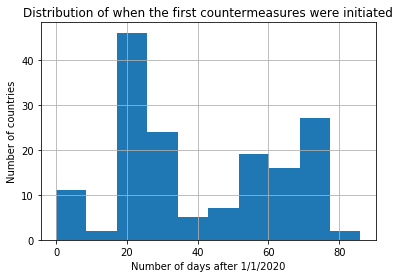

In [49]:
ax = stringency_df[['country','above_0']].hist()
ax[0][0].set_xlabel('Number of days after 1/1/2020')
ax[0][0].set_ylabel("Number of countries")
ax[0][0].set_title('Distribution of when the first countermeasures were initiated');

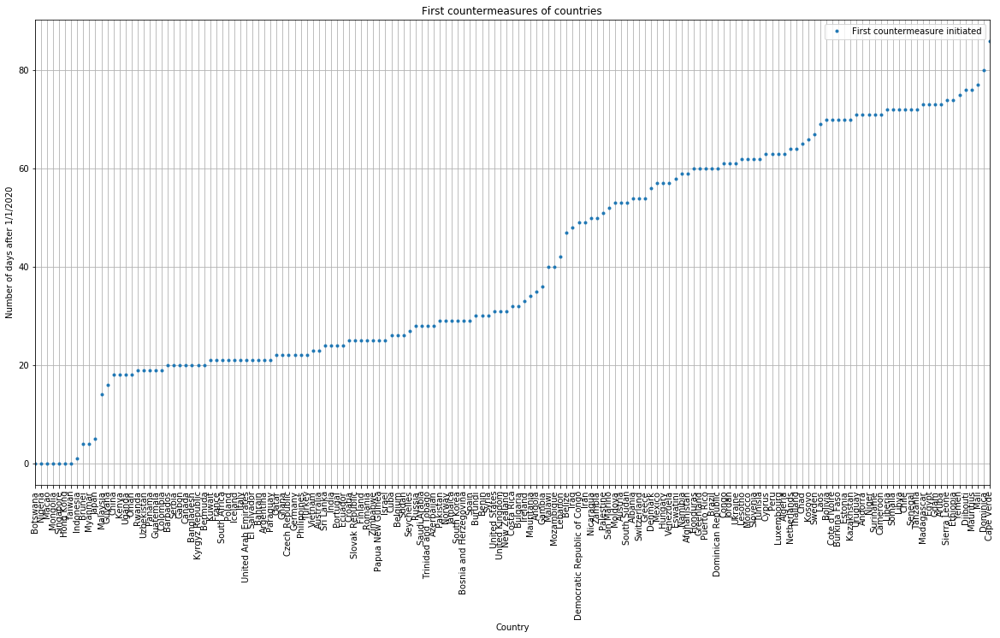

In [50]:
%matplotlib inline
ax = stringency_df.sort_values(by='above_0').plot(title='First countermeasures of countries',style='.',x = 'country', y='above_0',grid=True, figsize=(20,10), xticks=stringency_df.index, rot=90)

ax.set_xticklabels(stringency_df.sort_values(by='above_0').country, rotation=90);
ax.set_ylabel('Number of days after 1/1/2020');
ax.set_xlabel('Country');
ax.legend(['First countermeasure initiated']);

The plot is not very pretty but it does provide an overview. It might be more interesting to see how many days after the first confirmed case the government responded with the first countermeasure. For this the dataset for the confirmed cases is used. 

First the day of the first confirmed case is obtained. 

In [51]:
confirmed_df.head()

,country_code,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,...,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20
0,ABW,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,100.0,100.0,101.0,101.0,101.0,101.0,101.0,101.0,101.0,101.0
1,AFG,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2704.0,2894.0,3224.0,3392.0,3563.0,3778.0,4033.0,4402.0,4687.0,4963.0
2,AGO,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,35.0,35.0,36.0,36.0,36.0,43.0,43.0,45.0,45.0,45.0
3,AIA,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0
4,ALB,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,795.0,803.0,820.0,832.0,842.0,850.0,856.0,868.0,872.0,876.0


This dataframe starts 22'nd of January while the other starts 1'st of January. So we need to compensate for this. 

In [52]:
#Get date of first confirmed case
confirmed_df['first_case'] = confirmed_df.iloc[:,1:].apply(lambda x: (np.where( x > 0)[0][0]), axis=1)
#Add 21 days to this
confirmed_df['first_case']= confirmed_df['first_case'] + 21

How many days are between the first case and the first countermeasures?

In [53]:
#Merge the two dataframes and store in a new variable
reaction_time_df = stringency_df.merge(confirmed_df, on='country_code')[['country', 'country_code','first_case']+stringency_cols]

In [54]:
#Convert the stringency columns from absolute days to difference between date of first case and date of first countermeasure
reaction_time_df[stringency_cols]=reaction_time_df[stringency_cols].apply(lambda x: x - reaction_time_df['first_case'])

Visualize the new data

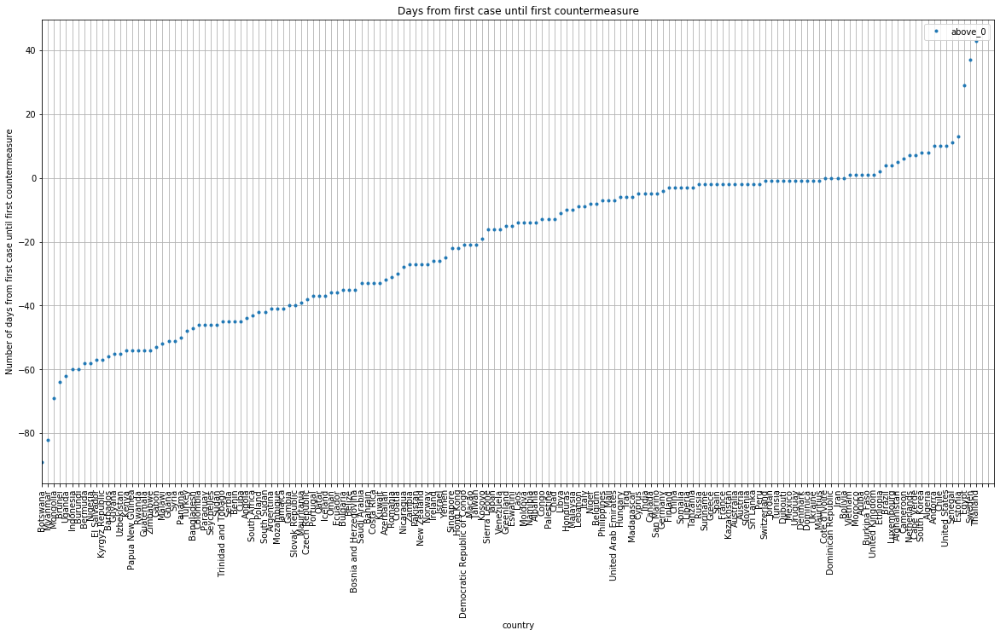

In [55]:
ax = reaction_time_df.sort_values(by='above_0').plot(title='Days from first case until first countermeasure',style='.',x = 'country', y='above_0',grid=True, figsize=(20,10), xticks=stringency_df.index, rot=90)

ax.set_xticklabels(reaction_time_df.sort_values(by='above_0').country, rotation=90);
ax.set_ylabel('Number of days from first case until first countermeasure');

The visualization is not very pretty, but it does give an overview. However a histogram might be better suited to show the distribution of the data. 

A plot is created showing the distribution of the data when setting the threshold to 0, 10, 20, 30.. etc. 

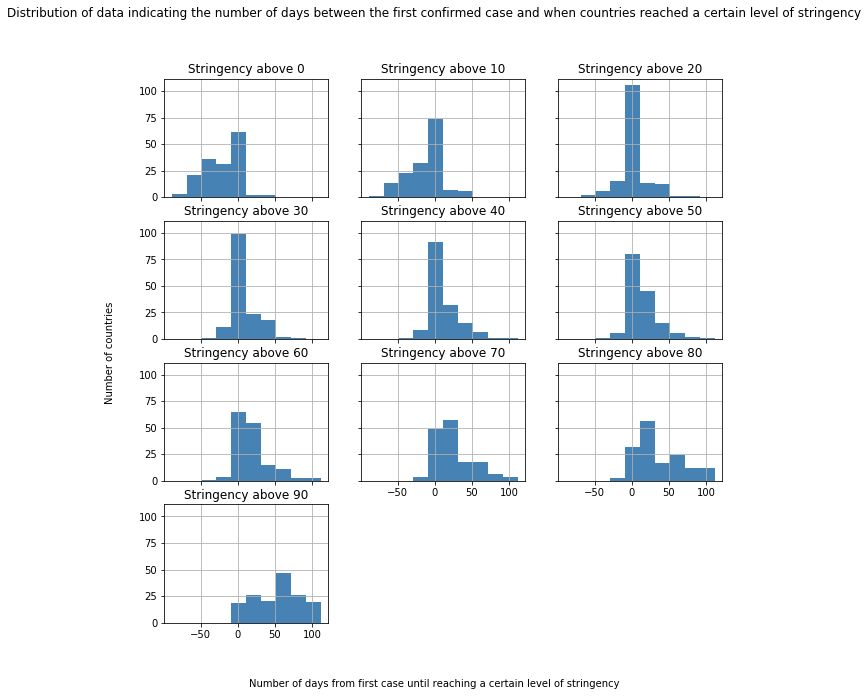

In [56]:
ax = reaction_time_df[['country']+stringency_cols].plot(kind='hist',subplots=True,sharex=True,sharey=True,
                                                        title='Distribution of data indicating the number of days between the first confirmed case and when countries reached a certain level of stringency',
                                                        layout=(4,3), figsize=(10,10),legend=False, grid=True, color='steelblue')

def getPlotNumber(i,j):
    return i*3+j


for i in range(4):
    for j in range(3):
        ax[i][j].set_title('Stringency above ' + str(getPlotNumber(i,j)*10))
        ax[i][j].set_ylabel('')

fig=ax[0,0].figure
fig.text(0.5,0.04, 'Number of days from first case until reaching a certain level of stringency', ha="center", va="center")
fig.text(0.05,0.5, "Number of countries", ha="center", va="center", rotation=90);


The plot shows that most countries initiated the first countermeasures before the first confirmed case and most countries reached a stringency of 20-40 around the same time as the first confirmed case.

#### Exploring correlation between death count and countermeasures

It is interesting to inspect whether any correlation between countermeasures and death count can be found. It is our assumption that early intervention does result in a lower death count. This will be explored in the following. 

First we will look at the total number of dead vs the number of days from first case to first countermeasure for each country. We will plot them against each other at do linear regression and calculate the R^2 value to evaluate the correlation. 

The final dead per million value is added to the reaction time dataframe.

In [57]:
#Get last date
last_date = dead_per_million_df.columns[-2]

#Merge the reaction time dataframe with dead per million for the last date in the dataset 
reaction_time_df = reaction_time_df.merge(dead_per_million_df[['country_code', last_date]], on='country_code')
#Rename column
reaction_time_df.rename(columns={last_date: "dead_per_million"}, inplace=True)
#Convert to numeric
reaction_time_df['dead_per_million']= pd.to_numeric(reaction_time_df['dead_per_million'], errors='coerce')

Methods to calculate R^2 are defined. These are taken from wikipedia: (https://en.wikipedia.org/wiki/Coefficient_of_determination)

In [58]:
#The total sum of squares
def SStot(Y):
    return sum([(y-np.mean(Y))*(y-np.mean(Y)) for y in Y])

#The regression sum of squares 
def SSres(Y, Y_pred):
    return sum([(y-y_pred)*(y-y_pred) for y,y_pred in zip(Y,Y_pred)])

#R^2
def R_squared(Y,Y_pred):
    return 1- (SSres(Y,Y_pred)/SStot(Y))


The death count is plotted against the number of days from the first confirmed case and the time the stringency level reached a certain threshold. This is plotted for the thresholds 0, 10, 20, .., 90. 

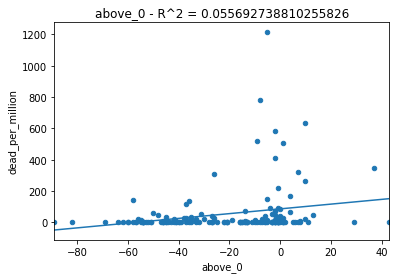

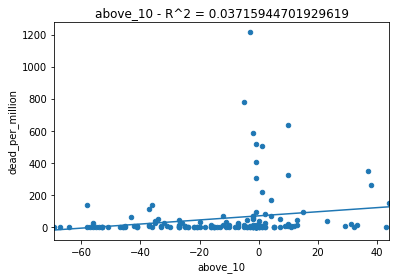

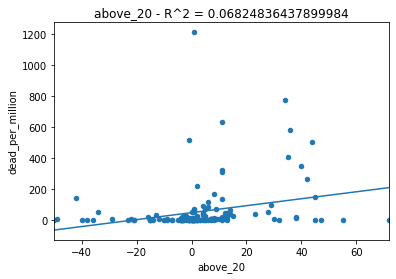

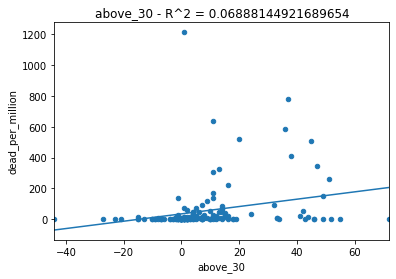

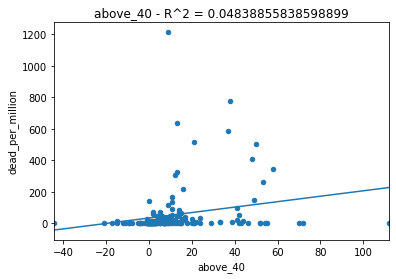

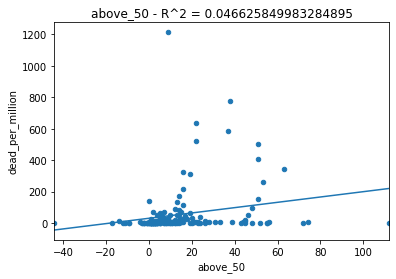

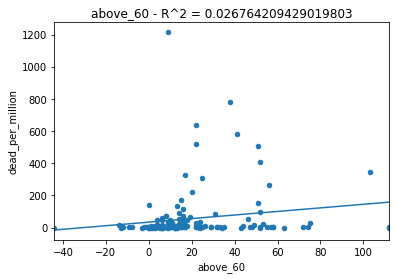

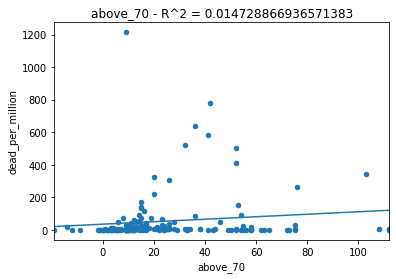

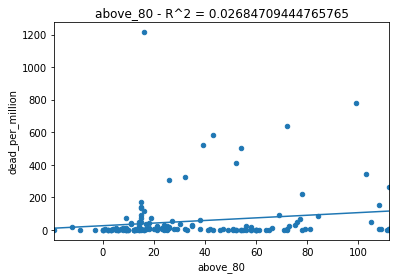

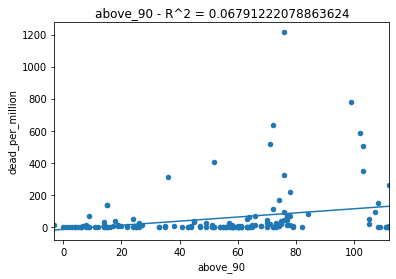

In [59]:
#Plot for each threshold
for i in range(10):
    #Copry dataframe to work on
    lin_reg_df = reaction_time_df.copy()
    #Define threshold
    num = str(i*10)
    #Linear regression
    z = np.polyfit(x=reaction_time_df.loc[:, 'above_'+num], y=reaction_time_df.loc[:, 'dead_per_million'], deg=1)
    p = np.poly1d(z)
    lin_reg_df['trendline'] = p(lin_reg_df.loc[:, 'above_'+num])
    #Plot scatter
    ax = lin_reg_df.plot.scatter(x='above_'+num, y='dead_per_million')
    #Calculate R^2
    r = R_squared(list(reaction_time_df['dead_per_million']), list(lin_reg_df['trendline']))
    #Plot line
    lin_reg_df.set_index('above_'+num, inplace=True)
    lin_reg_df.trendline.sort_index(ascending=False).plot(title='above_'+num +' - R^2 = '+str(r),ax=ax)


The trend is in the expected direction, but it is not a very strong correlation.

__What happens if we look at when *specific* countermeasures were initiated instead?__

In the following dead per million and the number of days from first case until the countermeasure was initiated is plotted against each other for each of the different countermeasures.

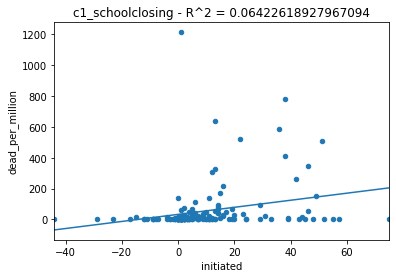

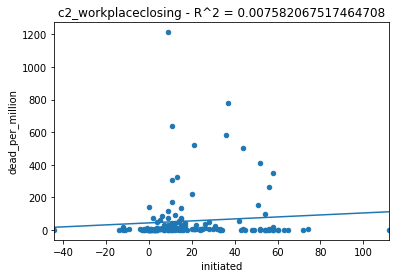

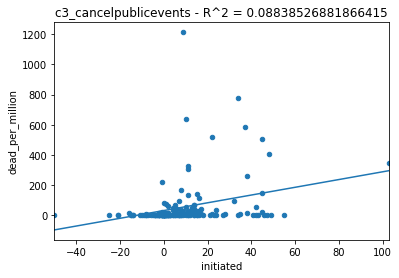

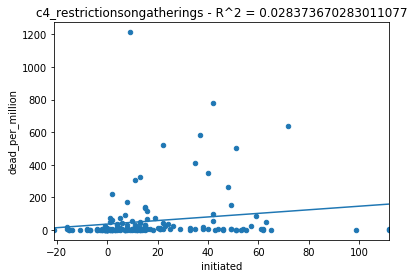

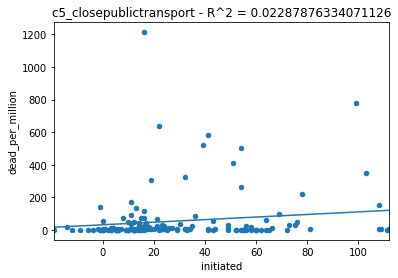

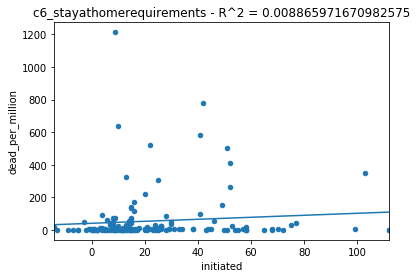

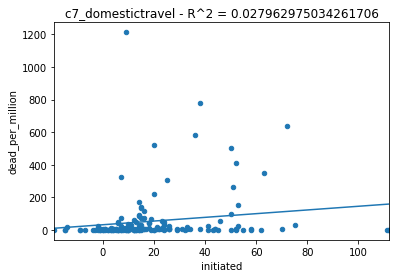

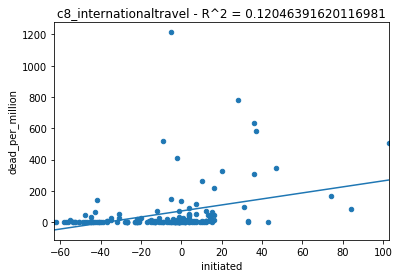

In [60]:
#The list of interesting countermeasures is created
countermeasures_list = [item for item in list(countermeasure_dfs.keys()) if (item.startswith('c') and '_' in item)]

#Plot for each countermeasure
for measure in countermeasures_list:
    #Copy dataframe to work on
    lin_reg_df = countermeasure_dfs[measure].copy()

    #Get day for when measure was initiated
    lin_reg_df['initiated'] = lin_reg_df.iloc[:,3:len(date_cols)+2].apply(pd.to_numeric, errors='coerce', axis=1).apply(lambda x: (np.where( x > (0))[0]), axis=1)
    lin_reg_df['initiated'] = lin_reg_df['initiated'].apply(getFirst)

    #Merge with confirmed cases
    lin_reg_df = lin_reg_df.merge(confirmed_df, on='country_code')[['country', 'country_code','first_case','initiated']]

    #Merge with dead per million
    lin_reg_df = lin_reg_df.merge(dead_per_million_df[['country_code', last_date]], on='country_code')
    lin_reg_df.rename(columns={last_date: "dead_per_million"}, inplace=True)
    lin_reg_df['dead_per_million']= pd.to_numeric(lin_reg_df['dead_per_million'], errors='coerce')

    #Get number of days from first case to countermeasre initiated
    lin_reg_df['initiated']=lin_reg_df['initiated']- lin_reg_df['first_case']

    #Linear regression
    z = np.polyfit(x=lin_reg_df.loc[:, 'initiated'], y=lin_reg_df.loc[:, 'dead_per_million'], deg=1)
    p = np.poly1d(z)
    lin_reg_df['trendline'] = p(lin_reg_df.loc[:, 'initiated'])
    
    #Plot scatter
    ax = lin_reg_df.plot.scatter(x='initiated', y='dead_per_million')
    
    #Calculate R^2
    r = R_squared(list(reaction_time_df['dead_per_million']), list(lin_reg_df['trendline']))
    
    #Plot line
    lin_reg_df.set_index('initiated', inplace=True)
    lin_reg_df.trendline.sort_index(ascending=False).plot(title=measure +' - R^2 = '+str(r),ax=ax)

Again the trend is in the expected direction, but there is not a strong correlation in any of them. 

It might be more fair to look at how many have died a certain amount of time after the first case, since the pandemic is not over yet and hence countries have not reached their total death count yet. So the death count for countries that were hit late might still grow larger than for some of the countries that currently have the highest death count. 

The death count 80 days after the first case is explored in the following.

In [61]:
#Create dataframe from confirmed
dead_after_days = confirmed_df.copy()[['country_code','first_case']]
#Get day for first case
dead_after_days['first_case_date'] = dead_after_days['first_case'].apply(lambda x: date_cols[x])
#Merge with dead per million dataframe
dead_after_days = dead_after_days.merge(dead_per_million_df, on='country_code')
#Filter out countries with first case less than 80 days before last date in dataset
dead_after_days = dead_after_days[dead_after_days.first_case <= 128-80].reset_index(drop=True).copy()
#Print size of dataframe
dead_after_days.shape


(29, 119)

As can be seen above there are only 29 countries with the first confirmed case more than 80 days ago. 

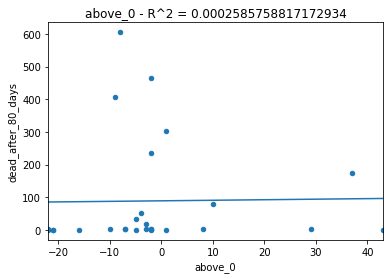

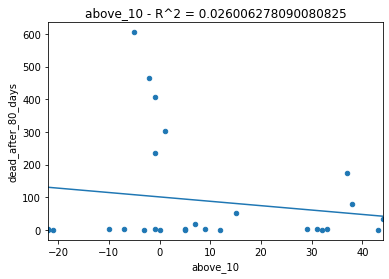

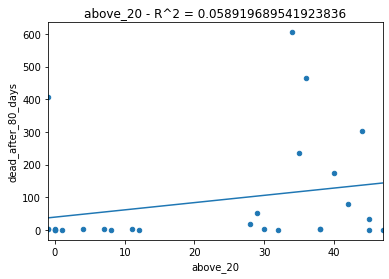

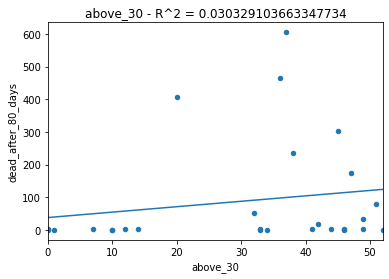

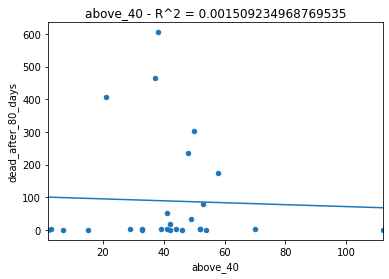

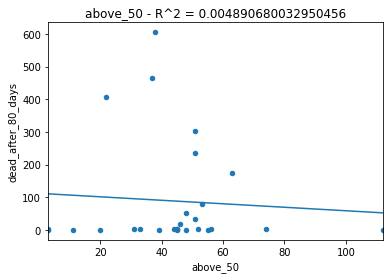

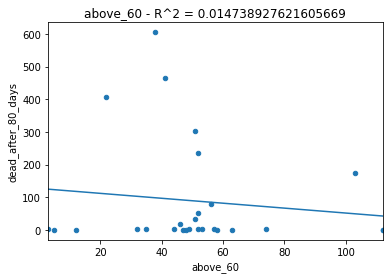

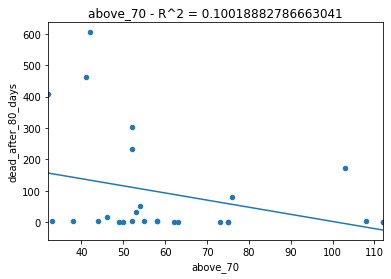

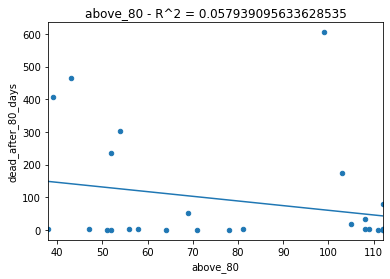

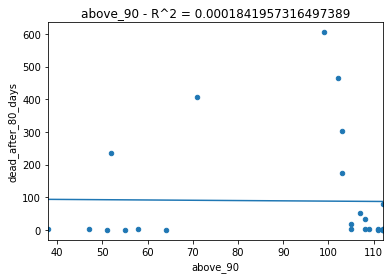

In [62]:
#Get date 80 days after first case
dead_after_days['date_after_80_days'] = dead_after_days['first_case'].apply(lambda x: date_cols[x+80])

#Get dead 80 days after first case
for index, row in dead_after_days.iterrows():
    dead_after_days.at[index,'dead_after_80_days'] = dead_after_days[row['date_after_80_days']][index]

#Add dead after 80 days to reaction time dataframe and store in new variable
new_reaction_time_df = reaction_time_df.merge(dead_after_days[['country_code','dead_after_80_days']], on='country_code')

#Plot and calculate R^2
for i in range(10):
    lin_reg_df = new_reaction_time_df.copy()
    num = str(i*10)
    z = np.polyfit(x=new_reaction_time_df.loc[:, 'above_'+num], y=new_reaction_time_df.loc[:, 'dead_after_80_days'], deg=1)
    p = np.poly1d(z)
    lin_reg_df['trendline'] = p(lin_reg_df.loc[:, 'above_'+num])
    ax = lin_reg_df.plot.scatter(x='above_'+num, y='dead_after_80_days')
    lin_reg_df.set_index('above_'+num, inplace=True)
    
    r = R_squared(list(new_reaction_time_df['dead_after_80_days']), list(lin_reg_df['trendline']))
    lin_reg_df.trendline.sort_index(ascending=False).plot(title='above_'+num +' - R^2 = '+str(r),ax=ax)


This gives an even more uncertain result. 

There are not many countries to work with here, since a lot of countries have been filtered out because their first case was not early enough. This analysis might give other results if done when the pandemic is over and we have the final death count for each country. 

## Data Analysis

The exploration of the correlation between countermeasures and death count in the previous section did not give the result we were hoping for. We were hoping we could dig deeper into the analysis of the correlation here, but there is not much to dig into. It was discussed whether it would make sense to do any machine learning to try to predict the death count based on countermeasures set, but this did not seem likely as there is little correlation to begin with. However if we could add other factors to the data such as population density, cultural differences etc and if we had the full overview of the pandemic i.e. it was over by the time of writing this, it could be interesting to look into using machine learning for some analysis. 

Instead we will create some interactive plots which lets the user explore the data on their own. 

### Interactive Graph and Scatter Plots

In [63]:
import numpy as np
import colorcet as cc
from bokeh.layouts import gridplot
from bokeh.plotting import figure, output_file, show
from bokeh.models import Legend
from bokeh.models import ColumnDataSource, LinearColorMapper
from bokeh.io import curdoc, output_notebook, show
from bokeh.models import LinearColorMapper
from bokeh.models import BasicTickFormatter, LogTicker,ColorBar
from bokeh.models import LogColorMapper

In [64]:
#Merge with gdf (remove country column because it is in both dfs)
dead = gdf.merge(dead_per_million_df.drop(['country'],axis=1), on = 'country_code', how = 'left')
countries = dead['country']
dead = dead.drop(['country','country_code','geometry','population'], axis=1)
latest = dead[dead.columns[-1]]

In [65]:
dead.fillna(0, inplace=True)
dead.head()

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.284099,0.284099,0.284099,0.372880,0.372880,0.372880,0.372880,0.372880,0.372880,0.372880
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,113.039737,117.789079,122.511436,126.721080,130.121177,134.654640,138.000767,142.992973,146.366085,150.872563
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,217.528983,224.847904,231.603596,236.250238,241.193801,243.431413,246.969963,252.094126,257.490720,262.936292


In [66]:
indexed_data = dead.loc()


In [67]:
counter = countermeasures_df
counter = counter.drop(counter.columns[11:], axis=1)
#counter = counter.sort_values(by='country_code')
counter = counter.drop('country_code', axis=1)
current_deaths = countermeasures_df['ConfirmedDeaths'].fillna(0)
counter = counter.join(current_deaths)
counter = counter.join(countermeasures_df['StringencyIndexForDisplay'].fillna(0))

counter.head()

,CountryName,Date,C1_School_closing,C2_Workplace_closing,C3_Cancel_public_events,C4_Restrictions_on_gatherings,C5_Close_public_transport,C6_Stay_at_home_requirements,C7_Restrictions_on_internal_movement,C8_International_travel_controls,ConfirmedDeaths,StringencyIndexForDisplay
0,Aruba,1/1/20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Aruba,1/2/20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Aruba,1/3/20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Aruba,1/4/20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Aruba,1/5/20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Helper functions

In [68]:
# the plots legend cannot display all counties, so this is a smaller list that we are interested in
interest = ['United States of America','United Kingdom','Japan','China','Germany','Russia',
            'India','Italy','Australia','Brazil','France','Spain','Denmark','Sweden','Norway']

In [69]:
    
# Some contries are not named the same in the two dataframes
def translator(strr):
    if strr=='United States':
        return'United States of America'
    
    if strr=='United States of America':
        return'United States'
        
    if strr=='Serbia':
        strr='Republic of Serbia'
        
    if strr=='Democratic Republic of Congo':
        strr='Democratic Republic of the Congo'
    
    if strr=='Dominica':
        strr='Dominican Republic'
        
    if strr=='Kyrgyz Republic':
        strr='Kyrgyzstan'
        
    if strr=='Tanzania':
        strr='United Republic of Tanzania'
        
    if strr=='Eswatini':
        strr='eSwatini'
    return strr

In [70]:
# finds the latest dead pr. million for a given country
def late(strr):
    
    strr=translator(strr)
    
    for i in range(len(countries)):
        if strr==countries[i]:
            return latest[i]/dead_per_million_df['population'][i]*1000000      
    return 

### Process the data

The aim is to find the first day of every countermeasure for every country, but we alto locate the fist day of death for every country. This is used for the scatter plot.

This also sets timestamps for whenever 'StringencyIndexForDisplay' is changed This will be usefull for the graph.

In [71]:
# Used to build a list for when the first countermeasures and deaths occured
arr = np.zeros((len(countries),10))
arr_c = []
days=-1
country = counter['CountryName'][0]
c1,c2,c3,c4,c5,c6,c7,c8,de=[0,0,0,0,0,0,0,0,0]
arr_country=0

# lists used to build index and values for when theres a difference in 'StringencyIndexForDisplay'
arr_str_indx = []
arr_str_iday = []
arr_n = []
arr_d = []
pre = counter['StringencyIndexForDisplay'][0]

for i in range(len(counter['Date'])):
    if i==len(counter['Date']):
        if not de == 0:
            arr[arr_country]=[c1-de,c2-de,c3-de,c4-de,c5-de,c6-de,c7-de,c8-de,de,late(country)]
        arr_c.append(country)
        arr_str_indx.append(arr_n)
        
        break 
    if not country == counter['CountryName'][i]:
        days=-1
        if not de == 0:
            arr[arr_country]=[c1-de,c2-de,c3-de,c4-de,c5-de,c6-de,c7-de,c8-de,de,late(country)]
        arr_c.append(country)
        arr_str_indx.append(arr_n)
        arr_str_iday.append(arr_d)
        arr_n = []
        arr_d = []
        country = counter['CountryName'][i]
        c1,c2,c3,c4,c5,c6,c7,c8,de=[0,0,0,0,0,0,0,0,0]
        arr_country+=1
        pre = counter['StringencyIndexForDisplay'][i]
        
    days+=1
    if not counter['C1_School_closing'][i]==0 and c1==0:
        c1=days
    
    if not counter['C2_Workplace_closing'][i]==0 and c2==0:
        c2=days
        
    if not counter['C3_Cancel_public_events'][i]==0 and c3==0:
        c3=days
        
    if not counter['C4_Restrictions_on_gatherings'][i]==0 and c4==0:
        c4=days
        
    if not counter['C5_Close_public_transport'][i]==0 and c5==0:
        c5=days
    
    if not counter['C6_Stay_at_home_requirements'][i]==0 and c6==0:
        c6=days
        
    if not counter['C7_Restrictions_on_internal_movement'][i]==0 and c7==0:
        c7=days
        
    if not counter['C8_International_travel_controls'][i]==0 and c8==0:
        c8=days
        
    if not counter['ConfirmedDeaths'][i]==0 and de==0:
        de=days
        
    
    if not pre == counter['StringencyIndexForDisplay'][i]:
        pre = counter['StringencyIndexForDisplay'][i]
        if not days-22 < 0:
            arr_d.append(days-22)
            arr_n.append(pre)


We put the collected data into a dataframe.

In [72]:
when_df=pd.DataFrame(arr, columns=['C1_School_closing','C2_Workplace_closing','C3_Cancel_public_events',
                                     'C4_Restrictions_on_gatherings','C5_Close_public_transport',
                                     'C6_Stay_at_home_requirements','C7_Restrictions_on_internal_movement',
                                     'C8_International_travel_controls','ConfirmedDeaths','Total_deaths_pr_million']) 
temp_df=pd.DataFrame(arr_c, columns=['Country'])
when_df=temp_df.join(when_df)

when_df[:]

,Country,C1_School_closing,C2_Workplace_closing,C3_Cancel_public_events,C4_Restrictions_on_gatherings,C5_Close_public_transport,C6_Stay_at_home_requirements,C7_Restrictions_on_internal_movement,C8_International_travel_controls,ConfirmedDeaths,Total_deaths_pr_million
0,Aruba,-31.0,-26.0,-18.0,-18.0,16.0,-26.0,-18.0,-32.0,106.0,NaN
1,Afghanistan,-10.0,0.0,-23.0,12.0,4.0,1.0,1.0,-22.0,83.0,0.071189
2,Angola,-6.0,-6.0,-3.0,-6.0,-3.0,-3.0,-3.0,-53.0,89.0,0.005229
3,Albania,-3.0,-3.0,-3.0,-3.0,1.0,1.0,1.0,-16.0,71.0,0.411808
4,Andorra,-11.0,-13.0,-14.0,47.0,-2.0,-14.0,43.0,12.0,86.0,NaN
5,United Arab Emirates,-21.0,-21.0,-7.0,5.0,4.0,1.0,1.0,-59.0,81.0,27.723887
6,Argentina,8.0,11.0,3.0,11.0,15.0,11.0,12.0,3.0,67.0,82.395826
7,Australia,23.0,22.0,15.0,15.0,-60.0,23.0,18.0,-29.0,60.0,10.453190
8,Austria,3.0,-1.0,-2.0,3.0,0.0,-7.0,0.0,-4.0,72.0,1867.852976
9,Azerbaijan,-18.0,2.0,-11.0,-7.0,10.0,10.0,-2.0,-51.0,80.0,0.017977


### The Graph

First we create some color palettes for the graph

In [73]:
#Define the graph colors
graph_pal = [cc.rainbow[i] for i in range(len(countries))]
#Define a palette of grays for the points on the graph
gray_pal = [cc.gray[i*2] for i in range(101)]
#Reverse color order 
gray_pal = gray_pal[::-1]

In [74]:
# Converts the StringencyIndexForDisplay data into gray colors
arr_gray = []
for i in range(len(arr_str_indx)):
    gr = []
    for j in range(len(arr_str_indx[i])):
        gr.append(gray_pal[int(arr_str_indx[i][j])])
    arr_gray.append(gr)

The graph shows death pr million over time some select countries. On each graph thers some dots. The intencity of the color of the dots represent the severity of the countrys countermeasures, with black being hard countermeasures and white being no counter measures.

In [75]:
# graph with points on
p1 = figure( title="Death pr. mil. over time", plot_width=800, plot_height=500)
p1.xaxis.axis_label = 'Days after Jan 22th'

legend_it = []

for i in range(len(countries)):
    if countries[i] in interest:
        if not when_df.index[when_df['Country']==translator(countries[i])].tolist() == []:
            
            c = p1.line(range(len(indexed_data[i])), indexed_data[i], line_width=2, color=graph_pal[i], 
                        alpha=0.8, muted_alpha=0.01, muted=True)
            d = []
            x = when_df.index[when_df['Country']==translator(countries[i])].tolist()[0]

            d = p1.circle(arr_str_iday[x], indexed_data[i][arr_str_iday[x]], size=10, 
                      fill_color = arr_gray[x], 
                      line_color=graph_pal[i], line_width=2, muted_alpha=0, muted=True)
            #print(str(j) + " " + str(len(arr_str_indx[i])))
            legend_it.append((countries[i],[c,d]))
        
    
legend = Legend(items=legend_it)
legend.click_policy="mute"
p1.add_layout(legend, 'right')
p1.legend.label_text_font_size = '8pt'

output_notebook()
output_file("./bokeh/graph.html")
show(p1)

Loading BokehJS ...

In case the plot is not shown it can be seen on the [website](https://mfholm.github.io/socialData/).

It is interesting to note that for countries such as Spain and US, if you zoom in on the markers close to the foot of the graph, you can tell that there alreddy was some deaths before most of the countermeasures started to be enforced. Compare this to Germany, and there could be an indication that when the first deaths starts to appear, it is too late to start implimenting countermeasures. In other words, countermeasures should be implimented way more in advanced to limit the end death count.

Another thing that can be seen is, if you only look on Norway, Sweeden and Denmark. All three of these countries started countermeasures very early, but the key difference is that Sweedens markers are generally lighter. This is becourse Sweeden chose to impliment a lot lighter restrictions than Norway and Denmark did. The current number of deaths could indicate that it was an unwise move of Sweeden to not be more strickt with their countermeasures.

This gives us an indication that countermeasures has to be both strickt and early for them to work, and the difference becomes very noticeable.

### The scatter plots

In [76]:
# filter out countries that have yet to have a death
filter_df = when_df[when_df.ConfirmedDeaths != 0]

In [77]:
from bokeh.models import HoverTool
#Define hover tool showing the country name and the death count
hover = HoverTool(tooltips = [ ('Country','@country'),('Deaths', '@ConfirmedDeaths')])

In [78]:
#Define the palette for the scatterplot
scatter_pal = cc.fire[:-25]
#Reverse color order 
scatter_pal = scatter_pal[::-1]

#Define logarithmic color mapper
color_mapper_scatter = LogColorMapper(palette = scatter_pal, low = 0.0001, 
                                      high = max(when_df['Total_deaths_pr_million'].fillna(0)),
                                      low_color = '#fff0ba', nan_color = '#d9d9d9')

In [79]:

#Define colorbar using logarithmic ticks
color_bar = ColorBar(color_mapper=color_mapper_scatter, ticker=LogTicker(),
                     label_standoff=2, border_line_color=None, location=(0,0), 
                     major_label_text_align='left', 
                     formatter = BasicTickFormatter(use_scientific = False,precision=6))


Each scatterplot shows each countrys timing with the different countermeasures. The day that the countermeasure was first recorded is relative to the first death in that country.

In [80]:
w = 450
h = 270
TOOLS='pan,wheel_zoom,box_zoom,reset'

pp = []

for i in range(1,9):
    n = when_df.columns[i]
    pa = figure( title=n, tools=TOOLS, plot_width=w, plot_height=h)
    pa.add_tools(HoverTool(tooltips=[("Country", "@Country"), ("Current deaths pr million", "@Total_deaths_pr_million")]))
    pa.xaxis.axis_label = 'Days before first confirmed death'
    pa.yaxis.axis_label = 'Relative first day of countermeasure'
    pa.x_range.start = 0
    pa.circle('ConfirmedDeaths', n, size=12, source = filter_df, 
         fill_color = {'field' : 'Total_deaths_pr_million', 'transform' : color_mapper_scatter}, 
          line_color="black", fill_alpha=0.6, line_alpha=0.6)
    if i%2==1:
        pa.add_layout(color_bar, 'left')
    else:
        pa.add_layout(color_bar, 'right')
        
    pp.append(pa)


In [112]:
from bokeh.layouts import column, row

layout = row(
    column(pp[0], pp[2], pp[4], pp[6]),
    column(pp[1], pp[3], pp[5], pp[7])
)

output_notebook()
output_file("./bokeh/scatter.html")
show(layout)

Loading BokehJS ...

In case the plot is not shown it can be seen on the [website](https://mfholm.github.io/socialData/).

### Map visualisation
Now a map visualization is created showing two maps: one visualizing the death count and one visualizing the countermeasures. 

A helper method is defined for converting the data into json format.

In [82]:
import json
def json_data(data):
    json_data = json.loads(data.to_json())
    json_data = json.dumps(json_data)
    return json_data

Define variable for most recent date which is shown initially on the plot.

In [83]:
from datetime import date
date_initial = date(2020, 5, 12)
date_initial_string = str(date_initial.month) + '/' + str(date_initial.day) + '/' + str(20)

#### Death count map

The map was created with using the following guide: https://towardsdatascience.com/a-complete-guide-to-an-interactive-geographical-map-using-python-f4c5197e23e0 (accessed 5/5/20).

The death count is merged with the geographical data and NaNs are replaced by 'No data'.

In [84]:
country_total_df = gdf[['country_code','geometry']].merge(country_total_df, on = 'country_code', how = 'left')
country_total_df.fillna('No data', inplace = True)

Create color mapper for mapping values to colors.

In [85]:
import colorcet as cc
from bokeh.models import LogColorMapper

#Define the palette
palette = cc.fire[:-25]
#Reverse color order 
palette = palette[::-1]

#Define constants for high and low (these will be used again later)
total_dead_color_mappper_low = 1
total_dead_color_mappper_high = 5e6
#Define logarithmic color mapper
color_mapper = LogColorMapper(palette = palette, low = total_dead_color_mappper_low, high = total_dead_color_mappper_high, low_color = '#fff0ba', nan_color = '#d9d9d9')
#The reason for not setting low = 0 is that we are using log scale and log(0) is undefined and this causes problems in
#the colorbar

Create a color bar for the plot

In [86]:
from bokeh.models import BasicTickFormatter, LogTicker,ColorBar,LinearColorMapper
#Define colorbar using logarithmic ticks
color_bar = ColorBar(color_mapper=color_mapper, ticker=LogTicker(),
                     label_standoff=2, border_line_color=None, location=(0,0), 
                     major_label_text_align='left', 
                     formatter = BasicTickFormatter(use_scientific = False,precision=6))

Create hover tool to allow users to hover over map to get more information.

In [87]:
from bokeh.models import HoverTool
#Define hover tool showing the country name and the death count
hover = HoverTool(tooltips = [ ('Country','@country'),('Deaths', '@selected')])


Define the data to be shown on the map. An extra column called 'selected' is created to hold the data for the selected date. This will be useful when adding the date slider late on. 

In [88]:
from bokeh.models import GeoJSONDataSource

#Add 'selected' column
country_total_df['selected'] = country_total_df[date_initial_string]

#Define GeoJSON source for plotting
geosource = GeoJSONDataSource(geojson = json_data(country_total_df))

Finally create the map

In [89]:
from bokeh.io import curdoc, output_notebook, show
from bokeh.plotting import figure

#Create figure
p = figure(title = 'Total Number of Dead', plot_height = 400 , plot_width = 800, toolbar_location = 'above', tools = [hover,"pan,wheel_zoom","box_zoom", "reset"])
p.xgrid.grid_line_color = None
p.ygrid.grid_line_color = None
p.axis.visible = False
p.add_layout(color_bar, 'right')

#Add patch renderer to figure 
p.patches('xs','ys', source = geosource,fill_color = {'field' :'selected', 'transform' : color_mapper},
          line_color = 'black', line_width = 0.25, fill_alpha = 1)

#Show figure inline in notebook
output_notebook()
show(p)

Loading BokehJS ...

In case the map is not displayed, here is a screen shot:
![map](https://github.com/MFHolm/socialData/blob/master/img/map_1.png?raw=true)

##### Add color labels for zero and 'no data'
In the above plot the value 0 does not show on the colorbar and there is no label for the gray color which indicates 'no data'. These are added in a slightly 'hacky' way as no elegant solution was found for this. A separate colorbar is added to show these colors.

Create the separate colorbar. First a colormapper is created with the three colors: light yellow for zero, white to make it look like there are two separate boxes, and gray for 'no data'. This is not an optimal solution, but it gets us what we want. 

The the colorbar is created with this colormapper and custom labels.

In [90]:
from bokeh.models import BasicTickFormatter, FixedTicker

#Define custom color mapper
mapper = LinearColorMapper(palette = ['#d9d9d9','white','#fff0ba'], low = 0, high = 3)

#Define custom ticks
ticker = FixedTicker(ticks=[0.5,2.5])
tick_labels = {'0.5': 'No data', 
               '2.5': '0'}
#Define colorbar
color_bar_custom = ColorBar(color_mapper=mapper,ticker=ticker,
                     label_standoff=2, major_label_text_align='left', border_line_color=None, location=(0,0), 
                                     major_label_overrides = tick_labels, height = 100)


The new colorbar is added to the figure and it is shown inline. 

In [91]:
from bokeh.io import output_file
from bokeh.layouts import widgetbox, row, column

p.add_layout(color_bar_custom, 'right')

#Display plot inline in Jupyter notebook
output_notebook()
#Display plot
show(p)

Loading BokehJS ...

As can be seen the two colors are added as two separate boxes to the right of the original colorbar. 

In case the map is not displayed, here is a screen shot:
![map](https://github.com/MFHolm/socialData/blob/master/img/map_2.png?raw=true)

#### Death count per million
Now the map is modified to show dead per million instead. 

First the geosource for total number of dead is stored in another variable. This is to be used later on, when a button is added for the user to switch between showing total number and per million.

In [92]:
total_dead_geosource = GeoJSONDataSource(geojson = json_data(country_total_df))

In [93]:
dead_per_million_df = gdf[['country_code','geometry']].merge(dead_per_million_df, on = 'country_code', how = 'left')
dead_per_million_df.fillna('No data', inplace = True)

The selected column is added to the dead per million dataframe as before.

In [94]:
#Add 'selected' column
dead_per_million_df['selected'] = dead_per_million_df[date_initial_string]


Then the geosource is created with the new data.

In [95]:
#Define geosource to show on map
per_million_geosource = GeoJSONDataSource(geojson = json_data(dead_per_million_df))

The colormapper needs to be updated because the range of the values is changed.

In [96]:
#Define constants for high and low (these will be used again later)
per_million_dead_color_mappper_low = 0.00001
per_million_dead_color_mappper_high = 1000

color_mapper.low=per_million_dead_color_mappper_low
color_mapper.high=per_million_dead_color_mappper_high

The new figure is created.

In [97]:
#Create figure
per_million_p = figure(title = 'Dead per million', plot_height = 400 , plot_width = 800, toolbar_location = 'above', tools = [hover,"pan,wheel_zoom","box_zoom", "reset"])
per_million_p.xgrid.grid_line_color = None
per_million_p.ygrid.grid_line_color = None
per_million_p.axis.visible = False
per_million_p.add_layout(color_bar, 'right')
per_million_p.add_layout(color_bar_custom, 'right')


#Add patch renderer to figure 
per_million_p.patches('xs','ys', source = per_million_geosource,fill_color = {'field' :'selected', 'transform' : color_mapper},
          line_color = 'black', line_width = 0.25, fill_alpha = 1)

#Show figure inline in notebook
output_notebook()
show(per_million_p)

Loading BokehJS ...

In case the map is not displayed, here is a screen shot:
![map](https://github.com/MFHolm/socialData/blob/master/img/map_3.png?raw=true)

#### Countermeasures map
Now the countermeasures map is created.

In [98]:
for key in countermeasure_dfs.keys():
    countermeasure_dfs[key] = gdf.merge(countermeasure_dfs[key], on = 'country_code', how = 'left')
    countermeasure_dfs[key].drop(columns=['country_y'], inplace = True)
    countermeasure_dfs[key].rename(columns={"country_x": "country"}, inplace = True)
    countermeasure_dfs[key].fillna('No data', inplace = True)

First the color mapper is created.

In [99]:
from bokeh.palettes import Oranges
from bokeh.models import LinearColorMapper


#Define palette
palette = Oranges[5]
#Reverse color order 
palette = palette[::-1]

#Define color mapper
countermeasures_color_mapper = LinearColorMapper(palette = palette, low = 0, high = 5, nan_color = '#d9d9d9')


Create the hover tool. A custom formatter is used to format the values shown in the hover tool.

In [100]:
from bokeh.models import CustomJSHover
#Define custom formatter
hover_formatter = CustomJSHover(code="""
    if (value == 0){
        return 'No measures / No restrictions'
    } if (value == 1) {
        return 'Recommendations only or mild restrictions'
    } if (value == 2) {
        return 'Medium restrictions'
    } if (value == 3) {
        return 'High restrictions'
    } if (value == 4) {
        return 'Severe restrictions'
    } else if (value == 'No data'){
        return value
    } else {
        return 'Unknown value: '+ value
    }
""")


#Add hover tool
countermeasures_hover = HoverTool(tooltips = [ ('Country','@country'),
                                              ('Severity of restrictions ', '@selected{custom}')],
    formatters={'@selected':hover_formatter})

Create color bar with custom tick labels.

In [101]:
from bokeh.models import FixedTicker

#Define fixed ticker in order to create custom tick labels and force labels to be placed at the center 
#of each colorbar
ticker = FixedTicker(ticks=[0.5,1.5,2.5,3.5, 4.5])
tick_labels = {'0.5': 'No restrictions', 
               '1.5': 'Mild restrictions', 
               '2.5': 'Medium restrictions', 
               '3.5': 'High restrictions',
               '4.5': 'Severe restrictions'}
#Define colorbar
countermeasures_color_bar = ColorBar(color_mapper=countermeasures_color_mapper,ticker=ticker,
                     label_standoff=2, major_label_text_align='left', border_line_color=None, location=(0,0), 
                                     major_label_overrides = tick_labels)


Create separate colorbar for the 'no data' color as was done for the death count map. 

In [102]:
from bokeh.models import BasicTickFormatter, FixedTicker

#Define custom color mapper
mapper = LinearColorMapper(palette = ['#d9d9d9'], low = 0, high = 2)

#Define custom ticks
ticker = FixedTicker(ticks=[1])
tick_labels = {'1': 'No data'}
#Define colorbar
color_bar_custom = ColorBar(color_mapper=mapper,ticker=ticker,
                     label_standoff=2, major_label_text_align='left', border_line_color=None, location=(0,0), 
                                     major_label_overrides = tick_labels, height = 50)


Define geosources to be used to display on the map. One geosource object is created for each countermeasure and these are saved in a dictionary. This will be used when adding the option for the used to select which countermeasure to show on the map. 

In [103]:
#Create dictionary
geosources = {}
items_to_include = [item for item in countermeasure_dfs.keys() if (item.startswith('c') and '_' in item and not ('flag' in item))]
#Add geosources to dictionary
for item in items_to_include:
    #Create 'selected' column to be used with the slider
    countermeasure_dfs[item]['selected'] = countermeasure_dfs[item][date_initial_string]
    #Convert to json and add to dictionary
    geosources[item] = GeoJSONDataSource(geojson = json_data(countermeasure_dfs[item]))
    
#Default countermeasure to show
countermeasures_geosource = GeoJSONDataSource(geojson = json_data(countermeasure_dfs[items_to_include[0]]))

Create the map

In [104]:

#Create figure 
countermeasures_p = figure(title = 'Countermeasures', plot_height = 400 , plot_width = 800, toolbar_location = 'above', tools = [countermeasures_hover,"pan,wheel_zoom","box_zoom", "reset"])
countermeasures_p.xgrid.grid_line_color = None
countermeasures_p.ygrid.grid_line_color = None
countermeasures_p.axis.visible = False
countermeasures_p.add_layout(countermeasures_color_bar, 'right')
countermeasures_p.add_layout(color_bar_custom, 'right')
#Add patch renderer to figure
countermeasures_p.patches('xs','ys', source = countermeasures_geosource,fill_color = {'field' :'selected', 'transform' : countermeasures_color_mapper},
          line_color = 'black', line_width = 0.25, fill_alpha = 1)
show(countermeasures_p)

In case the map is not displayed, here is a screen shot:
![map](https://github.com/MFHolm/socialData/blob/master/img/map_4.png?raw=true)

#### Slider

Create a slider to allow the user to select which date to show. Javascript is used to write a callback method to update the data to display.

In [105]:
from bokeh.models import DateSlider, CustomJS

#Define update method using javascript code
update_map = CustomJS(args=dict(source=geosource, countermeasures_source = countermeasures_geosource), code="""
    //Selected date
    var d = new Date(cb_obj.value);
    var day = d.getDate()
    var month = d.getMonth()+1
    //Selected date in string format
    var date = month + '/' + day + '/20'
    
    //Update the 'selected' object to contain the selected date
    d = source.attributes.data
    d['selected'] = d[date]
    source.attributes.data = d
    //Emit changes
    source.change.emit();
    
    //Update the 'selected' object to contain the selected date
    d = countermeasures_source.attributes.data
    d['selected'] = d[date]
    countermeasures_source.attributes.data = d
    //Emit changes
    countermeasures_source.change.emit();
""")
    
#Define slider
slider = DateSlider(title = 'Date',start=date(2020, 1, 22), end=date_initial,
                    value=date_initial, step = 1, width=p.plot_width-100)

slider.js_on_change('value', update_map)


#### Play Button
Create button for automatically progressing the time and updating the map accordingly. 

In [106]:
from bokeh.models.widgets import Button, TableColumn, Toggle

#Define callback method to start and stop time progression
play_callback = CustomJS(args=dict(slider=slider, date_initial=date_initial),code="""
    var update = function(index){
        //Get current selected date
        var slider_date = new Date(slider.value);
        //Define min and max date in order to loop the time
        const max_date = new Date(date_initial);
        const min_date = new Date(2020,0,22);
        
        //Get value of toggle button
        var toggle_val = cb_obj.active;
        
        //If pause has been pressed
        if(toggle_val == false) {
            //Update label of button
            cb_obj.label = '► Play';
            //Stop time progression
            clearInterval(interval);
            } 
            
        //Otherwise if max is reached
        else if (slider_date >= max_date) {
            //When max date is reached, value is set back to start date
            var new_date = min_date;
            slider.value = new_date.valueOf() 
        }else{
            //Increment slider value
            var new_date = slider_date.setDate(slider_date.getDate() + 1);
            slider.value = new_date.valueOf() 
        }        
    }
    //If pause
    if(cb_obj.active == false){
        //Update label (time progression will be stopped in update method)
        cb_obj.label = '► Play';
    }
    else {
        //Update label
        cb_obj.label = '❚❚ Pause';
        //Start time progression
        var interval = setInterval(update, 500);
    };
""")

#Create toggle button
play_button = Toggle(label='► Play',active=False)
play_button.js_on_change('active',play_callback)


#### Countermeasure Selection
Create dropdown menu to enable the user to select which countermeasure to show on the map. 

First the labels for the dropdown is defined and a dictionary is defined to map labels to countermeasure name

In [107]:
#List countermeasure included
items_to_include

['c1_schoolclosing',
 'c2_workplaceclosing',
 'c3_cancelpublicevents',
 'c4_restrictionsongatherings',
 'c5_closepublictransport',
 'c6_stayathomerequirements',
 'c7_domestictravel',
 'c8_internationaltravel']

In [108]:
#Define dictionary to map label to countermeasure name
labels = {
    'Schools closing': 'c1_schoolclosing',
    'Workplace closing': 'c2_workplaceclosing',
    'Calcel public events': 'c3_cancelpublicevents',
    'Restrictions on gatherings': 'c4_restrictionsongatherings',
    'Close public transport': 'c5_closepublictransport',
    'Stay at home requirements': 'c6_stayathomerequirements',
    'Restrictions on domestic travel': 'c7_domestictravel',
    'Restrictions on international travel': 'c8_internationaltravel'
    }


The dropdown menu is created with a custom Javascript callback to update the map.

In [109]:
from bokeh.models import Select


#Define update method to update the data displayed
update_countermeasure = CustomJS(args=dict(p=p, source=countermeasures_geosource, 
                              countermeasure_sources = geosources,
                              labels = labels,slider=slider
                             ), code="""
            //Selected value
            var selected = cb_obj.value;
            var slider_date = new Date(slider.value);
            
            //Get countermeasure from label 
            countermeasure = labels[selected]
            
            //Get current selected date
            var day = slider_date.getDate()
            var month = slider_date.getMonth()+1
            //Selected date in string format
            var date = month + '/' + day + '/20'
            
            //Update source to use new selected data
            source.attributes.data = countermeasure_sources[countermeasure].attributes.data;
            d = source.attributes.data
            d['selected'] = d[date]
            source.attributes.data = d
            
            //Emit changes
            source.change.emit();
        """)

#Create select menu
select = Select(title="Countermeasure:", value=items_to_include[0], 
                options=list(labels.keys()), callback=update_countermeasure, width = 400)

#### Button to switch between showing total number of dead and dead per million
To let the user decide if they want to see total number of dead or dead per million a toggle button is created.

In [110]:

#Define callback method to switch between showing total deaths and dead per million
toggle_js = CustomJS(args=dict(source=geosource, 
                               per_million_source = per_million_geosource,
                               total_dead_source = total_dead_geosource, 
                               color_mapper = color_mapper,
                               figure = p,
                               slider=slider),code="""
    
    //Get value of toggle button
    var show_per_million = cb_obj.active;
    
    //Get value of slider
    var d = new Date(slider.value);
    var day = d.getDate()
    var month = d.getMonth()+1
    
    //Selected date in string format
    var date = month + '/' + day + '/20'
    console.log(date)
    if(show_per_million == false){//Show total number of dead
        cb_obj.label = 'Show dead per million';
        //Update source
        source.attributes.data = total_dead_source.attributes.data;
        color_mapper.low=1
        color_mapper.high=1000000
        figure.title.text = 'Total Number of Dead'
        
    }
    else { //Show per million
        //Update label
        cb_obj.label = 'Show total number of dead'; 
        source.attributes.data = per_million_source.attributes.data;
        color_mapper.low=0.00001
        color_mapper.high=1000
        figure.title.text = 'Dead per million'
    }
    
    d = source.attributes.data
    d['selected'] = d[date]
    source.attributes.data = d
            
    //Emit changes
    source.change.emit();
    ;
""")

#Create toggle button
toggle_button = Toggle(label='Show dead per million',active=False, width=400)
toggle_button.js_on_change('active',toggle_js)


#### Combine everything
Finally the two maps, the toggle button, the slider, the play button and the select menu are combined and displayed as well as saved in a HTML file which can be displayed on a website. 

In [111]:
from bokeh.io import output_file
from bokeh.layouts import widgetbox, row, column

#The color mapper is reset to show total number of dead
color_mapper.low=total_dead_color_mappper_low
color_mapper.high=total_dead_color_mappper_high


# Make a column layout of the toggle button, the death count plot, the slider, 
#the play button and the countermeasure map
layout = column(p,toggle_button,widgetbox(slider, play_button), countermeasures_p,select)
curdoc().add_root(layout)
#Display plot inline in Jupyter notebook
output_notebook()
output_file("./bokeh/map.html")
#Display plot
show(layout)

Loading BokehJS ...

In case the map is not shown it can be seen on the [website](https://mfholm.github.io/socialData/)

Visualization showed an error in Kazakhstan because 20/3 there are registered 3 dead but 21/3 there are registered 0 dead. Looking at other sources (https://www.worldometers.info/coronavirus/country/kazakhstan/ and https://en.wikipedia.org/wiki/2020_coronavirus_pandemic_in_Kazakhstan) this seems to be an error and the number should be 0 20/3.

There are a number of gaps in the countermeasures data, especially in the last dates. Data has not been collected for all countermeasures for all dates for all countries. For some values there are days where the value is missing and for some countries there are countermeasures that have never been recorded for that country. There are a number of ways to handle this. The first option is to just display the data that is in the dataset and leave the gaps as they are. Another option is to try to fill the gaps manually. For the missing days, this could be done if e.g. there are only a few days missing and the value is the same for the last day before the gap and the first day after the gap. Then it is quite likely that the gap should be filled with this value. However if the gap gets larger or if the value is not the same before the gap as after the gap then the solution is not trivial. It was decided to display the original data and not try to mend it. 

If the play button is activated it is fascinating to see how the whole world closed down during the month of March and also the see how it is slowly starting to open up again at the end of April and start of May.

## Genre

The genre of visualisation that this follows, is mostly based on the annotated chart genre but with ellemets of animation (in the map). 

For this kind of data it made a lot of sence to include a timebar into the visual structuring. This is present for most of the visualisations. 

For the map the timebar was taken a step further. Here time is an interactive ellement with a possibility to play, pause and rewind the map. This helps showing the data as a direct part of the world instead of jsut being data. The map of course also includes a very familliar object, the earth itself.

Some of the findings to be had on the graph are almost unnoticeable, but allowing the user to zoom in and get a close-up helps showing some of the key points that can be taken away from this.

Most of the narrative structure is mostly random access oriented, meaning that there is no real story, but rather the user should look at the map ect. themselves and se if they can find more information. 

The map and the scatter plots have interactive hover highlighting which helps the user get more information about any given country/datapoint.

The graph has the interactive ability that users can choose which countries they want to compare compare. This is becourse of with 200+ different graphs on top of each other, almost nothing can be seen. But limiting this to however many contries you want makes each datapoint stand out much more (it should be noted, that bokeh currently does not support any kind of formatting which would have allowed all countries to show up on the legend. This explains why the list of possible viewable graphs has been limited to a select few)


## Visualizations

The story that we wanted to tell is mostly focused viewing the data and exploring what fould happen if we compared countermeasures over time. The map is a great tool to put everything into perspective of the real world. 

The initial idea was actually the graph, but the way that the data has been weigted for each countrys popolation makes it very difficult to tell whats happening. For example, india has the largest population in the world, so their graph is almost completely flat. Unfortunantly it is also the case, that most countrys whent into lockdown almost immidiatly, so a lot of the data that we had hoped would show up, all landed at the beginning of the graphs growth and not a lot before or after that point.

The scatterplots rose from the idea that different countermeasures could have affected the outcome in a veriety of different ways. If on the scatterplot, the ligth and dark colored points had been seperated into a lower and upper cloud respectivly, it would had shown a noticable difference in when a countermeasure was enforced and when it becomes "too late". 

Mostly for the scatterplot, by not showing the desired outcome is actually shows that there is little to no correlation in the data. This is also backed up by the linear regresion.


## Discussion

### What went well?

The datasets are plentyfull and theres a lot of data in them to be looked at. This comes with a lot of different nuances in countermeasures that we didn't expect. 

The map really shows the spread of the virus and the countermeasures in a way that can be hard to comprehend. 

### What is still missing? 

At the beginning we were to eager to dive into the visualisation and ended up spending too little time on data exploration. Had we spend more time on the exploration, we would maybe have found something more noteworthy or interesting to show. 

Neither the graph nor the scatter plots quite show what we had hoped for. This is mostly becourse of how the data is. It's not impossible that by correlating some different measures we might have been able to better show what we wanted to, or it could just be the case that there is not a lot to find with this analysis, it's hard to know for sure.


### What could be improved?

A potential improvement could be to look at different states or territories independant of each other, or maybe take into account the difference in population dencity. This could have helped when comparing so many different sized countries with each other. Had this helped it could have been a great addition to showing the importance of the different countermeasures. It would be great if there were some interesting correlations to look into.

The interactive graph leaves a lot to be desired. Noteably; the x-axis unfortunantly had to be displayed in a rather strange way. It's not unreadable, but not very intuitive either.



## Contributions
The following table states the main contributors for each part.


| Part                                   | Main contributor  |
|:---------------------------------------|:------------------|
| Data preparation                       | Marita |
| Basic stats                            | Marita |
| Exploration of correlation             | Marita |
| Interactive graph                      | Frederik |
| Interactive scatterplots               | Frederik |
| Interactive map                        | Marita |  
| Motivation section                     | Frederik |
| Genre section                          | Frederik |
| Visualization section                  | Frederik |
| Discussion section                     | Frederik |
| Writing data story on website          | Both |  